# Preps

In [56]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import os
import glob
import numpy as np


curfolder = os.getcwd()
ikfolder = os.path.join(curfolder, 'TS_motiontracking')
mergefolder = os.path.join(curfolder, 'TS_merged')

# load all csv files in the folder that starts with ik_
ikfiles = glob.glob(os.path.join(ikfolder, 'ik_*.csv'))


In [63]:
# load in one sample

df = pd.read_csv(ikfiles[40])
# print the id
print(df['TrialID'].iloc[0])
# get rid of the time column
df = df.drop(columns=['time', 'TrialID'])

# get rid of all cols that includes speed, acc or jerk
df = df.loc[:,~df.columns.str.contains('speed|acc|jerk|angAcc|angJerk|angSpeed')]

# list all the columns
allcols = df.columns
allcols


# get only armcols
armkeywords = ['arm', 'elbow', 'pro_sup', 'wrist']

# get all columns that include the keywords
armdf = df.loc[:, df.columns.str.contains('|'.join(armkeywords))]

# list all the cols
armcols = armdf.columns
armcols



0_1_48_p1


Index(['arm_flex_r', 'arm_add_r', 'arm_rot_r', 'elbow_flex_r', 'pro_sup_r',
       'wrist_flex_r', 'wrist_dev_r', 'arm_flex_l', 'arm_add_l', 'arm_rot_l',
       'elbow_flex_l', 'pro_sup_l', 'wrist_flex_l', 'wrist_dev_l'],
      dtype='object')

In [64]:
allcols


Index(['pelvis_tilt', 'pelvis_list', 'pelvis_rotation', 'pelvis_tx',
       'pelvis_ty', 'pelvis_tz', 'hip_flexion_r', 'hip_adduction_r',
       'hip_rotation_r', 'knee_angle_r', 'knee_angle_r_beta', 'ankle_angle_r',
       'hip_flexion_l', 'hip_adduction_l', 'hip_rotation_l', 'knee_angle_l',
       'knee_angle_l_beta', 'ankle_angle_l', 'neck_flexion', 'neck_bending',
       'neck_rotation', 'arm_flex_r', 'arm_add_r', 'arm_rot_r', 'elbow_flex_r',
       'pro_sup_r', 'wrist_flex_r', 'wrist_dev_r', 'arm_flex_l', 'arm_add_l',
       'arm_rot_l', 'elbow_flex_l', 'pro_sup_l', 'wrist_flex_l',
       'wrist_dev_l'],
      dtype='object')

# PCA function

In [50]:
def get_PCA(df):
    # Step 1: Standardize the Data
    scaler = StandardScaler()
    standardized_data = scaler.fit_transform(df)
    
    # Step 2: Apply PCA
    pca = PCA()
    pca.fit(standardized_data)
    
    # Step 3: Explained Variance
    explained_variance = pca.explained_variance_ratio_
    cumulative_explained_variance = explained_variance.cumsum()

    # Step 4: Find the number of components that explain 95% variance
    n_components_for_80_variance = np.argmax(cumulative_explained_variance >= 0.8) + 1
    
    # Step 5: Compute the slope for the first n_components_for_95_variance
    if n_components_for_80_variance > 1:
        slope_80 = (cumulative_explained_variance[n_components_for_80_variance-1] - cumulative_explained_variance[0]) / (n_components_for_80_variance - 1)
    else:
        slope_80 = cumulative_explained_variance[0]  # Only one component case

    # 95% variance
    n_components_for_95_variance = np.argmax(cumulative_explained_variance >= 0.95) + 1
    
    # Step 5: Compute the slope for the first n_components_for_95_variance
    if n_components_for_95_variance > 1:
        slope_95 = (cumulative_explained_variance[n_components_for_95_variance-1] - cumulative_explained_variance[0]) / (n_components_for_95_variance - 1)
    else:
        slope_95 = cumulative_explained_variance[0]  # Only one component case


    # Optionally plot the cumulative explained variance
    plt.figure(figsize=(8, 6))
    plt.plot(cumulative_explained_variance, marker='o', label='Cumulative Explained Variance')
    plt.axvline(x=n_components_for_80_variance-1, color='red', linestyle='--', label=f'80% Variance at {n_components_for_80_variance} components')
    plt.axvline(x=n_components_for_95_variance-1, color='green', linestyle='--', label=f'95% Variance at {n_components_for_95_variance} components')
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Cumulative Explained Variance by PCA')
    plt.grid(True)
    plt.legend()
    plt.show()

    return n_components_for_80_variance, slope_80, n_components_for_95_variance, slope_95




# Whole-body complexity

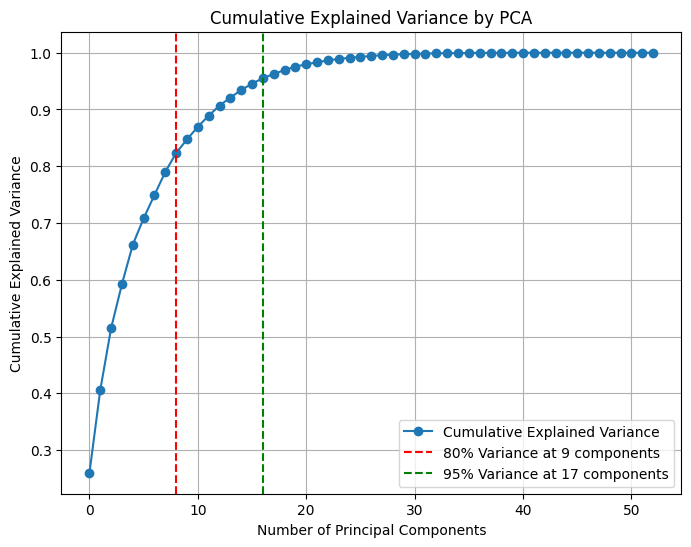

9 0.07042095853058505 17 0.043438835766565057


In [51]:
# use the function
n_components_80, slope_80, n_components_95, slope_95 = get_PCA(df)

print(n_components_80, slope_80, n_components_95, slope_95)

# Arm complexity

In [43]:
armkeywords = ['arm', 'elbow', 'pro_sup', 'wrist']

# get all columns that include the keywords
armdf = df.loc[:, df.columns.str.contains('|'.join(armkeywords))]

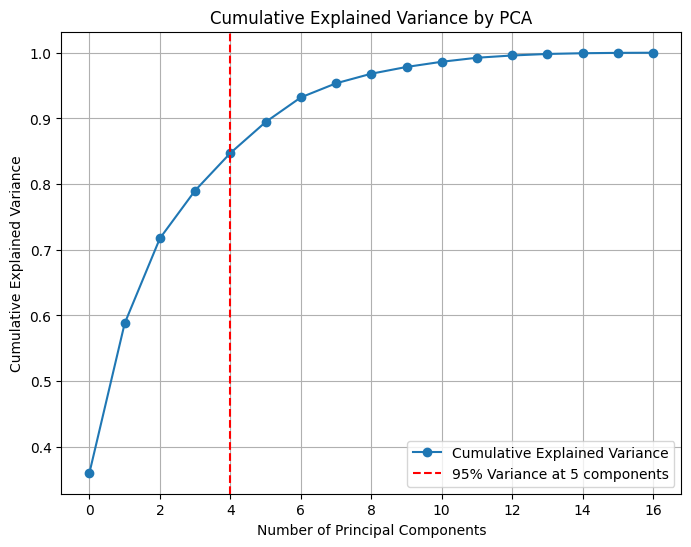

Number of components to explain 95% variance: 5
Slope for 95% variance components: 0.12165901533752246


In [44]:
# PCA
n_components, slope_95 = calculate_slope_for_95_percent_variance(armdf)
print(f"Number of components to explain 95% variance: {n_components}")
print(f"Slope for 95% variance components: {slope_95}")


# Loop

In [66]:
bodydf

,pelvis_tilt_moment,pelvis_list_moment,pelvis_rotation_moment,pelvis_tx_force,pelvis_ty_force,pelvis_tz_force,hip_flexion_r_moment,hip_adduction_r_moment,hip_rotation_r_moment,hip_flexion_l_moment,...,head_angAcc_sum,arm_angAcc_sum,pelvis_angAcc_sum,spine_angAcc_sum,lowerbody_angJerk_sum,leg_angJerk_sum,head_angJerk_sum,arm_angJerk_sum,pelvis_angJerk_sum,spine_angJerk_sum
0,0.317117,41.028067,-2.255874,-12.654614,627.876166,4.406878,-46.300653,1.237909,-0.009126,-45.610879,...,0.050345,0.133344,0.182582,0.0,0.011961,0.003127,0.005995,0.034315,0.006503,0.0
1,0.107160,41.063787,-2.349490,-11.518857,627.839097,3.679184,-46.202815,1.487555,-0.009832,-45.642361,...,0.050101,0.134542,0.181149,0.0,0.012061,0.003140,0.005960,0.033938,0.006676,0.0
2,-0.102796,41.099508,-2.443106,-10.383100,627.802027,2.951489,-46.104976,1.737202,-0.010539,-45.673844,...,0.049858,0.135741,0.179716,0.0,0.012161,0.003154,0.005924,0.033561,0.006849,0.0
3,-0.312753,41.135228,-2.536723,-9.247344,627.764958,2.223794,-46.007138,1.986849,-0.011245,-45.705326,...,0.049614,0.136939,0.178283,0.0,0.012261,0.003168,0.005889,0.033184,0.007022,0.0
4,-0.522710,41.170948,-2.630339,-8.111587,627.727888,1.496100,-45.909300,2.236495,-0.011951,-45.736808,...,0.049370,0.138138,0.176850,0.0,0.012361,0.003182,0.005854,0.032807,0.007195,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3243,6.279497,49.340366,5.442281,2.266864,638.597189,-0.553581,-51.317464,0.113005,1.433620,-47.785835,...,0.116873,0.938974,0.266679,0.0,0.030457,0.015503,0.007232,0.099964,0.025677,0.0
3244,6.279497,49.340366,5.442281,2.266864,638.597189,-0.553581,-51.317464,0.113005,1.433620,-47.785835,...,0.116873,0.938974,0.266679,0.0,0.030457,0.015503,0.007232,0.099964,0.025677,0.0
3245,6.279497,49.340366,5.442281,2.266864,638.597189,-0.553581,-51.317464,0.113005,1.433620,-47.785835,...,0.116873,0.938974,0.266679,0.0,0.030457,0.015503,0.007232,0.099964,0.025677,0.0
3246,6.279497,49.340366,5.442281,2.266864,638.597189,-0.553581,-51.317464,0.113005,1.433620,-47.785835,...,0.116873,0.938974,0.266679,0.0,0.030457,0.015503,0.007232,0.099964,0.025677,0.0


In [68]:
df

,time,left_back,right_forward,right_back,left_forward,COPXc,COPYc,COPc,TrialID,FileInfo,...,flux,lowerbody_power,leg_power,head_power,arm_power,upper_body,arms,lower_body,head_mov,movement_in_trial
0,0.0,1.037280,0.911848,1.480585,1.400018,-0.000047,-0.000060,0.000076,0_1_28_p1,p1_gek_combinatie,...,NaN,108.597255,121.679753,40.970258,252.733682,nomovement,nomovement,nomovement,nomovement,nomovement
1,2.0,1.037338,0.911849,1.480742,1.400165,-0.000026,-0.000022,0.000034,0_1_28_p1,p1_gek_combinatie,...,NaN,108.478562,121.471102,40.914632,252.331764,nomovement,nomovement,nomovement,nomovement,nomovement
2,4.0,1.037375,0.911864,1.480842,1.400268,-0.000007,0.000010,0.000012,0_1_28_p1,p1_gek_combinatie,...,NaN,108.299252,121.183139,40.834570,251.770039,nomovement,nomovement,nomovement,nomovement,nomovement
3,6.0,1.037397,0.911893,1.480895,1.400335,0.000008,0.000038,0.000039,0_1_28_p1,p1_gek_combinatie,...,NaN,108.060666,120.818736,40.730799,251.053971,nomovement,nomovement,nomovement,nomovement,nomovement
4,8.0,1.037405,0.911933,1.480911,1.400374,0.000021,0.000061,0.000065,0_1_28_p1,p1_gek_combinatie,...,NaN,107.764147,120.380766,40.604044,250.189022,nomovement,nomovement,nomovement,nomovement,nomovement
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2312,4624.0,1.027709,0.914018,1.477353,1.397614,-0.000055,0.000226,0.000233,0_1_28_p1,p1_gek_combinatie,...,NaN,197.028450,46.112739,15.496031,143.346598,nomovement,nomovement,nomovement,nomovement,nomovement
2313,4626.0,1.027731,0.914025,1.477320,1.397706,-0.000118,0.000123,0.000170,0_1_28_p1,p1_gek_combinatie,...,NaN,198.652725,46.604946,15.577727,143.660195,nomovement,nomovement,nomovement,nomovement,nomovement
2314,4628.0,1.027796,0.913974,1.477346,1.397832,-0.000205,-0.000009,0.000205,0_1_28_p1,p1_gek_combinatie,...,NaN,200.143043,47.060531,15.654151,143.944065,nomovement,nomovement,nomovement,nomovement,nomovement
2315,4630.0,1.027909,0.913848,1.477444,1.398001,-0.000321,-0.000173,0.000365,0_1_28_p1,p1_gek_combinatie,...,NaN,201.474241,47.471854,15.723999,144.193079,nomovement,nomovement,nomovement,nomovement,nomovement


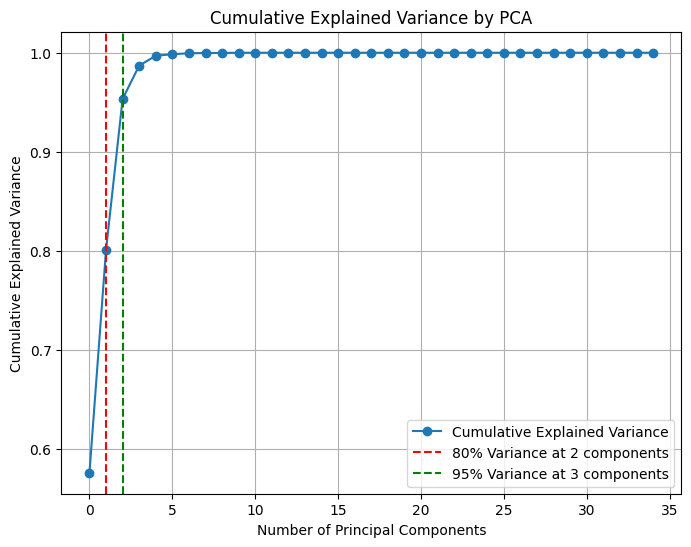

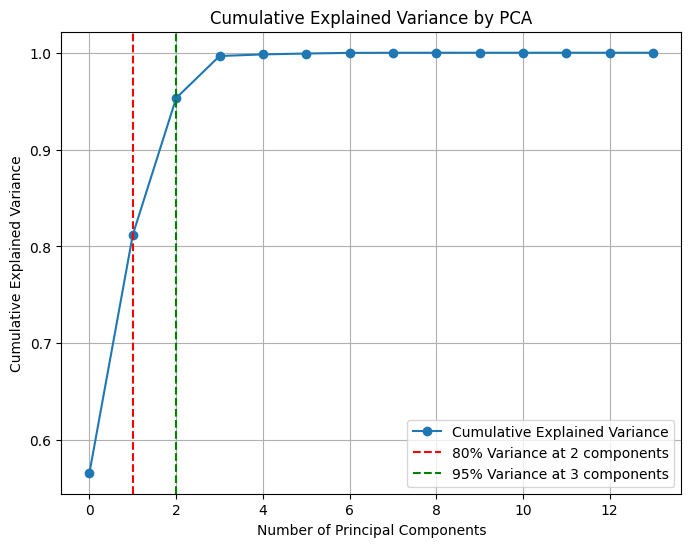

C:\Users\Sarka Kadava\AppData\Local\Temp\ipykernel_13968\811691068.py:45: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, row], ignore_index=True)


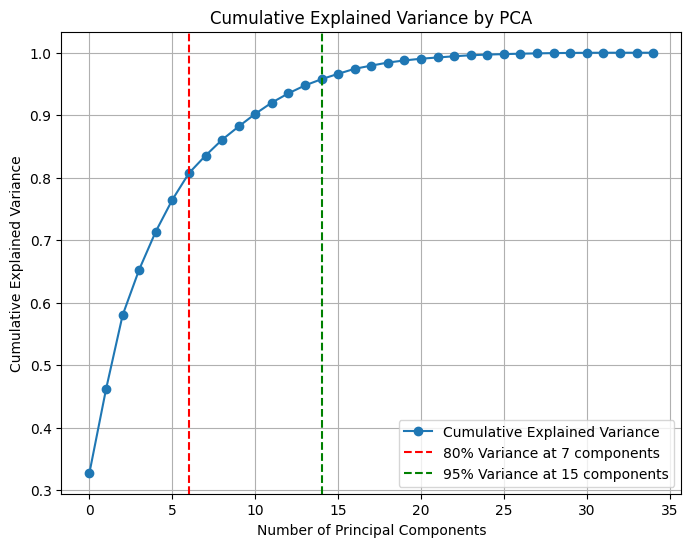

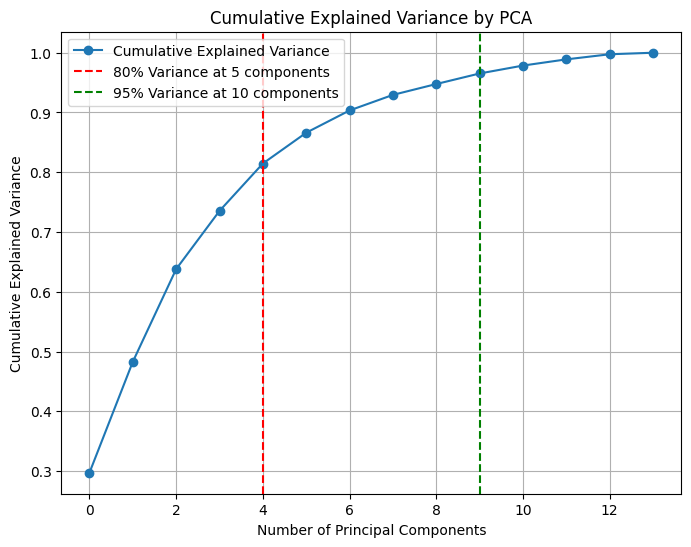

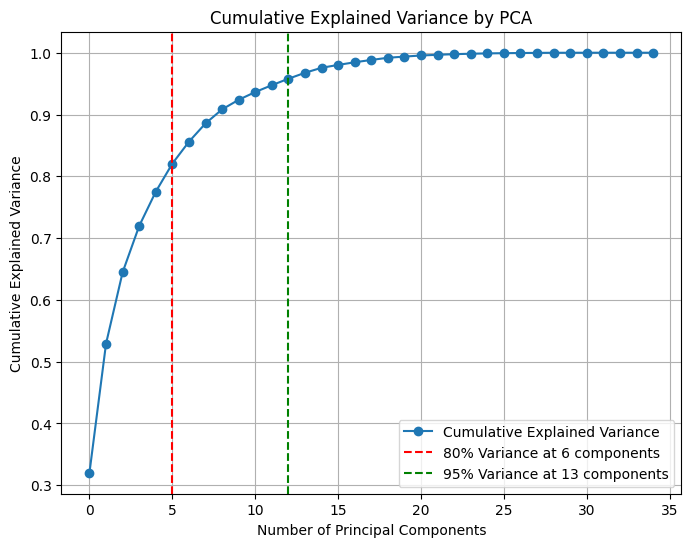

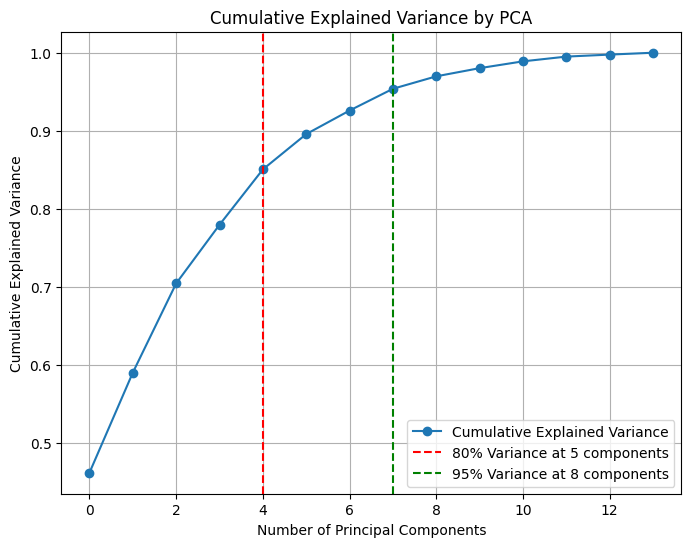

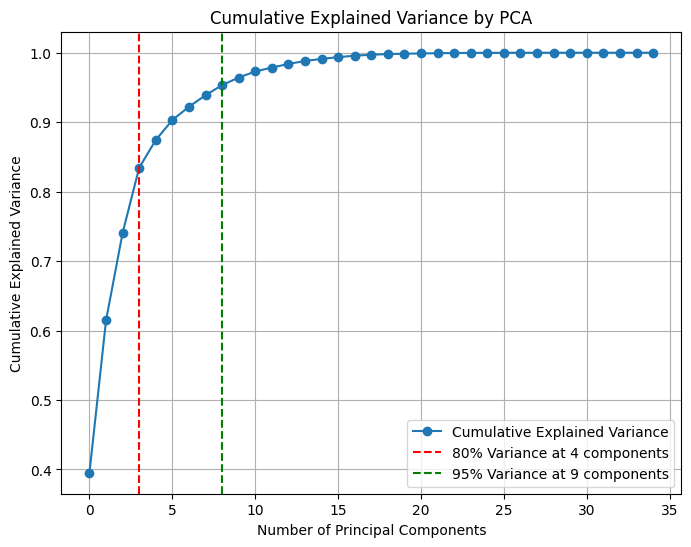

...

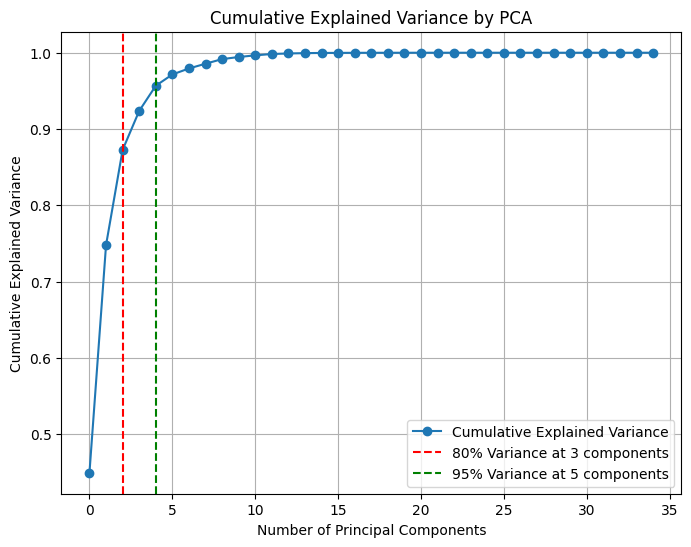

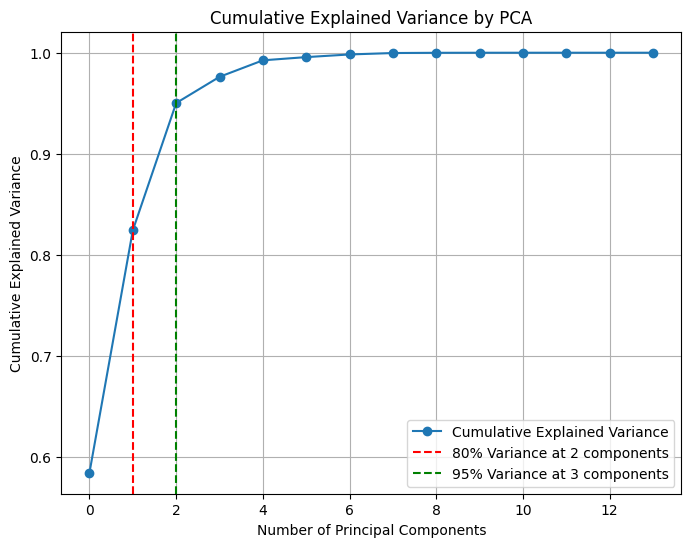

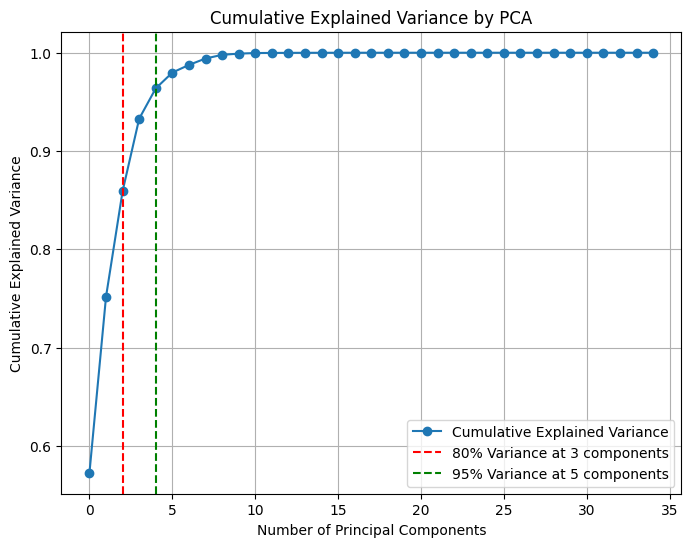

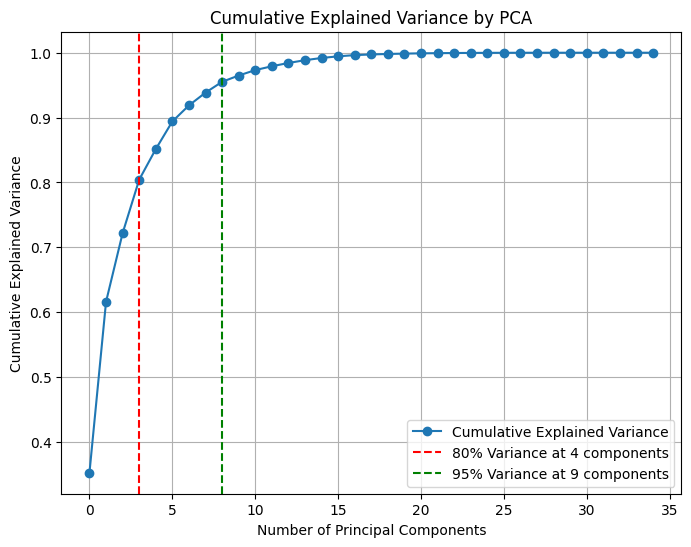

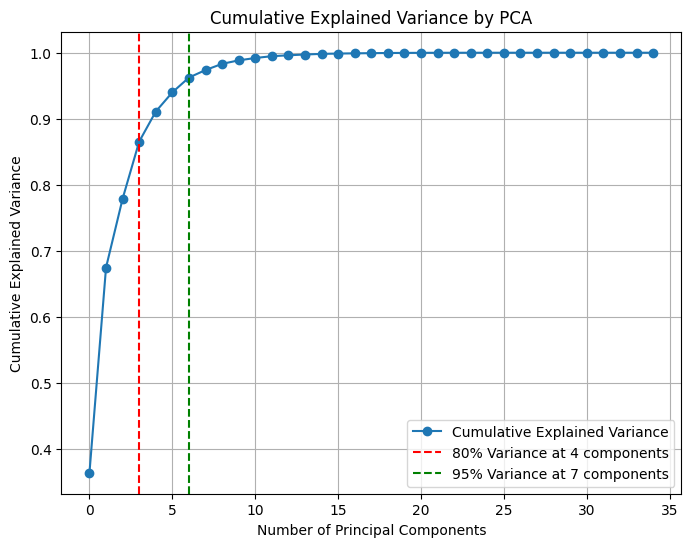

In [70]:
mergedfiles = glob.glob(os.path.join(mergefolder, 'merged_anno*.csv'))

# prepare empty df to store the results
results = pd.DataFrame(columns=['TrialID', 'Body_nComp_80', 'Body_slope_80', 'Body_nComp_95', 'Body_slope_95', 'Arm_nComp_80', 'Arm_slope_80', 'Arm_nComp_95', 'Arm_slope_95'])

# loop over files in mergefolder
for file in mergedfiles:
    # load the file
    df = pd.read_csv(file)
    trialid = df['TrialID'].iloc[0]

    # get only subdf where movement_in_trial is movement
    subdf = df.loc[df['movement_in_trial'] == 'movement']

    if subdf.shape[0] == 0:
        row = pd.DataFrame([[trialid, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan]], columns=results.columns)
        results = pd.concat([results, row], ignore_index=True)
        continue

    # whole-body PCA, get cols that are exactly those in allcols
    bodydf = subdf.loc[:, allcols]

    # PCA
    body_nComp_80, body_slope_80, body_nComp_95, body_slope_95 = get_PCA(bodydf)

    # now from subdf get only where arms is movement
    subsubdf = subdf.loc[subdf['arms'] == 'movement']

    # if subsubdf is empty, fill the row with NaNs
    if subsubdf.shape[0] == 0:
        row = pd.DataFrame([[trialid, body_nComp_80, body_slope_80, body_nComp_95, body_slope_95, np.nan, np.nan, np.nan, np.nan]], columns=results.columns)
        results = pd.concat([results, row], ignore_index=True)
        continue

    # arm PCA, get cols that are saved in list armcols
    armdf = subsubdf.loc[:, armcols]

    # PCA
    arm_nComp_80, arm_slope_80, arm_nComp_95, arm_slope_95 = get_PCA(armdf)

    # create a row
    row = pd.DataFrame([[trialid, body_nComp_80, body_slope_80, body_nComp_95, body_slope_95, arm_nComp_80, arm_slope_80, arm_nComp_95, arm_slope_95]], columns=results.columns)

    # concat the row to the results
    results = pd.concat([results, row], ignore_index=True)





In [72]:
results

# save the results
results.to_csv('PCA_motorComplexity.csv', index=False)